# Procesamiento de imagenes

## Importar imagenes

In [1]:
from PIL import Image
import matplotlib.pyplot as plt

suricatas = Image.open(r"images\suricatas.jpeg")
    
print(isinstance(suricatas, Image.Image))
print(type(suricatas))
print(id(suricatas))

True
<class 'PIL.JpegImagePlugin.JpegImageFile'>
2478439134112


## Imprimiendo imagen

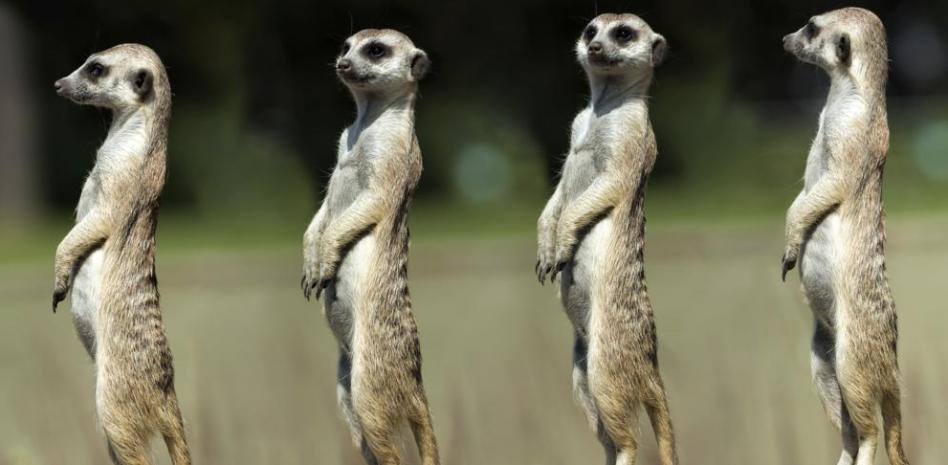

In [343]:
suricatas

In [3]:
print("Image format:",suricatas.format)
print("Image size:",suricatas.size)
print("Image mode:",suricatas.mode)

Image format: JPEG
Image size: (948, 465)
Image mode: RGB


## Operaciones con imagen

### Crop imagen

Ejemplo de como funciona la sintaxis del metodo crop.

![Crop Pillow Instructions](images/crop_pillow.jpg)

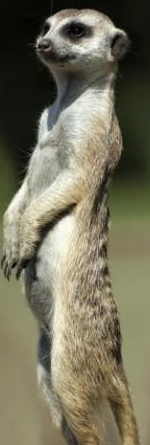

In [4]:
crop_suricatas = suricatas.crop(box=(300,20,450,465))
crop_suricatas

### Redimensionar imagen

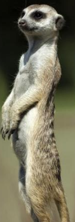

In [5]:
# Redimensiona la imagen en la proporcion deseada
suricatas_lowres = crop_suricatas.resize((crop_suricatas.width//2,crop_suricatas.height//2))
suricatas_lowres

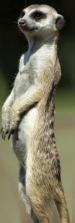

In [6]:
# Redimensiona la imagen en la misma proporcion
crop_suricatas.reduce(2)

In [7]:
# Exporta las imagenes a la carpeta export
crop_suricatas.save(r"export\crop_suricatas.jpg")
suricatas_lowres.save(r"export\suricatas_lowres.jpg")

### Manejo de imagen

#### Flip

Flip es un filtro que te permite realizar diferentes transformaciones, segun el argumento dado:

* FLIP_LEFT_RIGHT: Rota de manera horizontal.
* FLIP_TOP_BOTTOM: Rota de manera vertical.
* ROTATE_90: Rota 90 grados.
* ROTATE_180: Rota 180 grados.
* ROTATE_270: Rota 270 grados.

C:\Users\chccr\AppData\Local\Temp\ipykernel_2568\3161080539.py:1: DeprecationWarning: FLIP_TOP_BOTTOM is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.FLIP_TOP_BOTTOM instead.
  flip_suricatas = suricatas.transpose(Image.FLIP_TOP_BOTTOM)


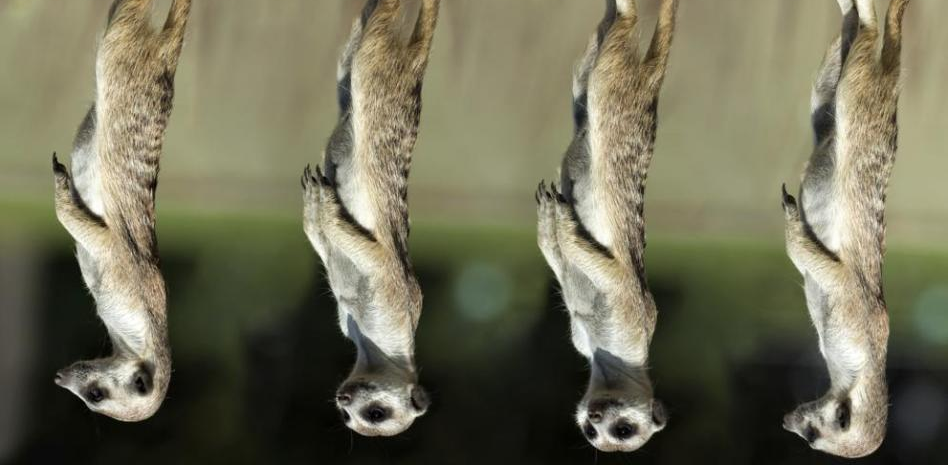

In [8]:
flip_suricatas = suricatas.transpose(Image.FLIP_TOP_BOTTOM)
flip_suricatas

#### Rotacion

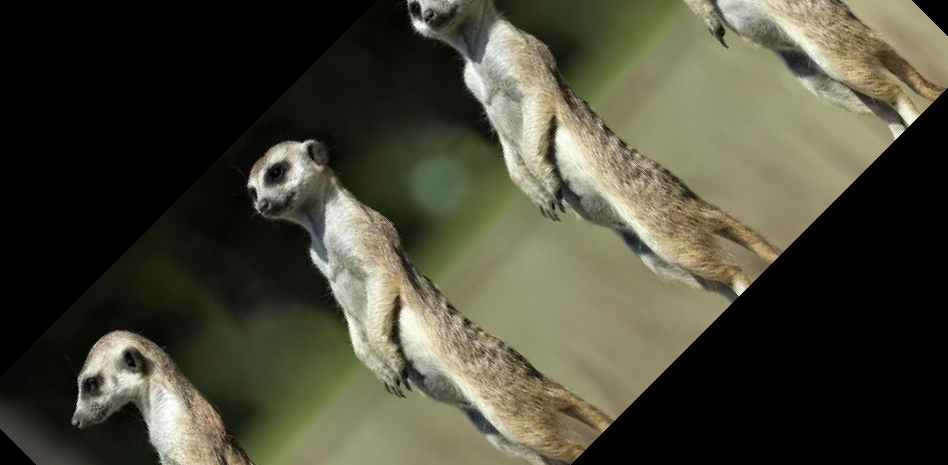

In [9]:
rotated_suricatas = suricatas.rotate(45)
rotated_suricatas

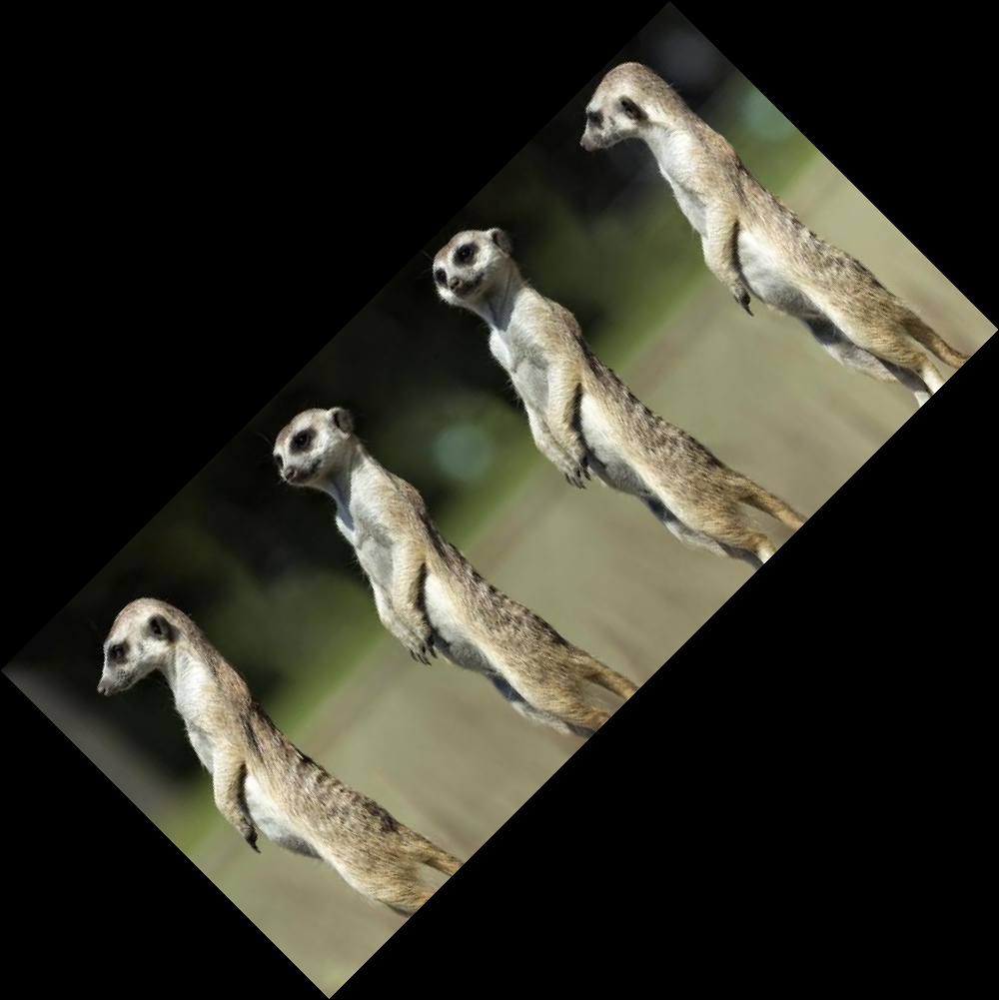

In [10]:
rotated_suricatas = suricatas.rotate(45, expand=True)
rotated_suricatas

## Modo de imagen

Modos de color en imagenes "RGB", "CMYK" y "Gray".

In [336]:
def get_concat_h(im1, im2):
    """Concatena dos imágenes del mismo tamaño y altura.

    Args:
        im1 (PIL.Image): Primera imagen.
        im2 (PIL.Image): Segunda imagen.

    Returns:
        PIL.Image: Imagen concatenada
    """
    image_merge = Image.new('RGB', (im1.width + im2.width, im1.height))
    image_merge.paste(im1, (0, 0))
    image_merge.paste(im2, (im1.width, 0))
    return image_merge.reduce(2)

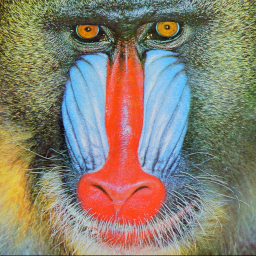

In [337]:
baboon = Image.open(r"images\baboon.png")
baboon.load()
baboon.reduce(2)

### Grayscale image

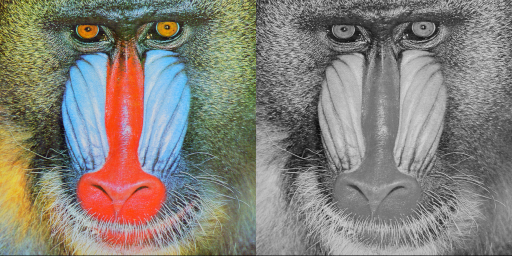

In [338]:
# Convierte la imagen a escala de grises.
get_concat_h(baboon, baboon.convert("L"))

### Capas RBG

In [339]:
# Muestra las capas segun el Modo de colores
print(baboon.getbands())

# Separa y asigna las diferentes capas de colores.
red, green, blue = baboon.split()

('R', 'G', 'B')


Las capas de colores se encuentran en modo escala de grises.

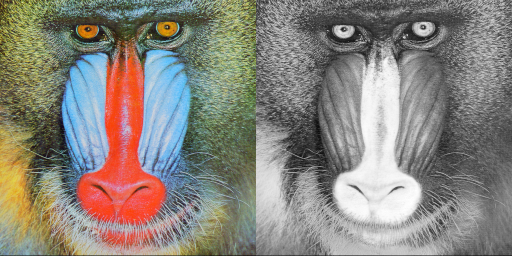

In [340]:
# Capa roja
get_concat_h(baboon,red)

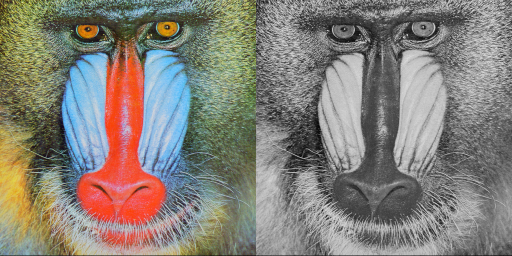

In [341]:
# Capa verde
get_concat_h(baboon, green)

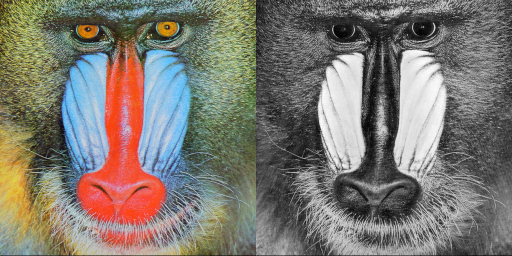

In [342]:
# Capa azul
get_concat_h(baboon, blue)

## Kernels (Filtros)

Los kernels realizan transformaciones para diferentes propósitos.

In [53]:
from PIL import ImageFilter

### Blur

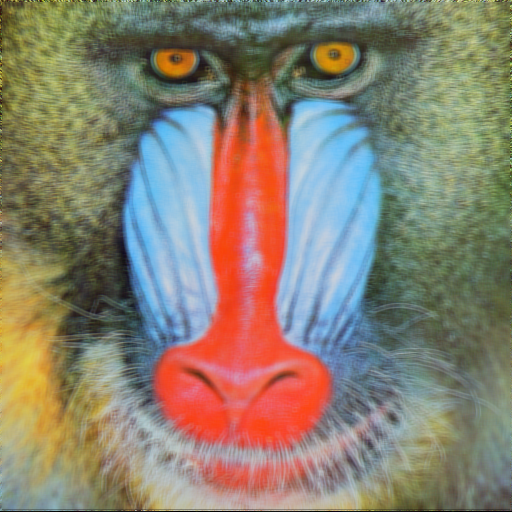

In [54]:
baboon.filter(ImageFilter.BLUR)

#### Boxblur

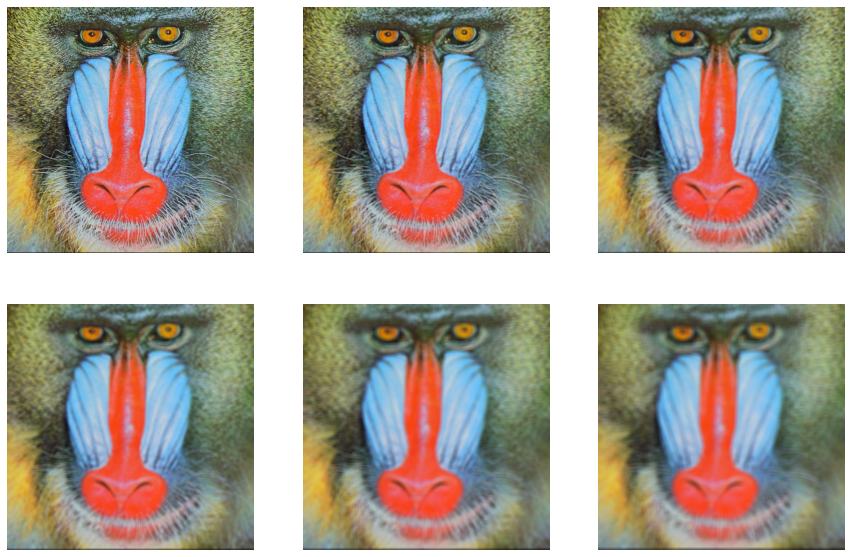

In [76]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15,10))
for i in range(6):
    plt.subplot(2,3,i+1)
    plt.imshow(baboon.filter(ImageFilter.BoxBlur(i)))
    plt.axis("off")
plt.show()

#### Gaussian Blur

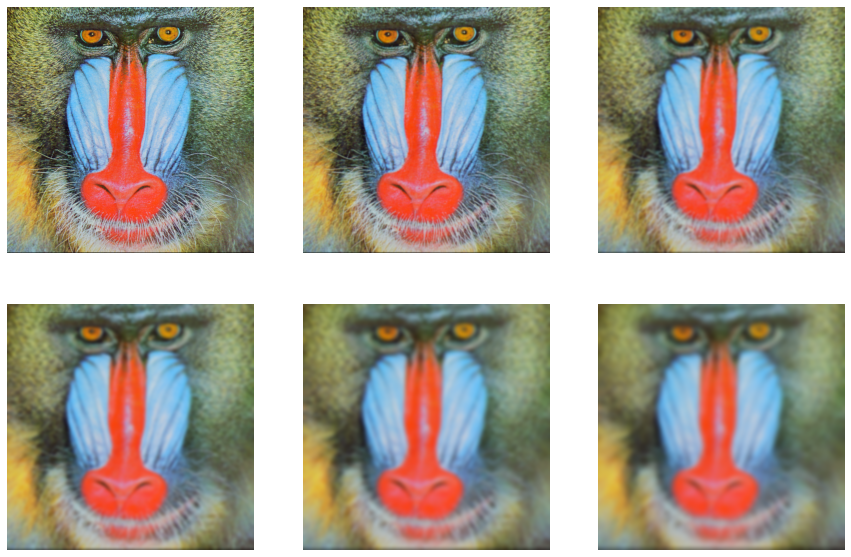

In [77]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 10))
for i in range(6):
    plt.subplot(2, 3, i+1)
    plt.imshow(baboon.filter(ImageFilter.GaussianBlur(i)))
    plt.axis("off")
plt.show()

### Sharpen

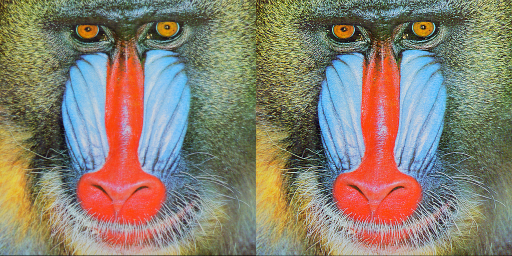

In [79]:
get_concat_h(baboon,baboon.filter(ImageFilter.SHARPEN))

### Smooth

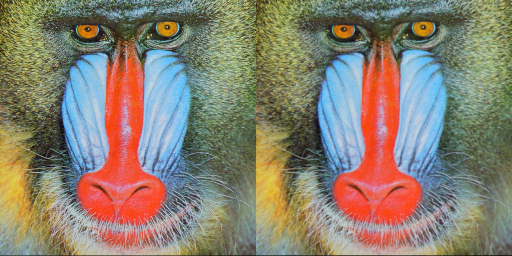

In [80]:
get_concat_h(baboon, baboon.filter(ImageFilter.SMOOTH))

### Find edges

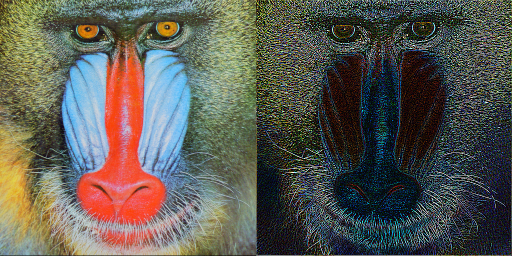

In [82]:
get_concat_h(baboon, baboon.filter(ImageFilter.FIND_EDGES))

### Edge Enhance

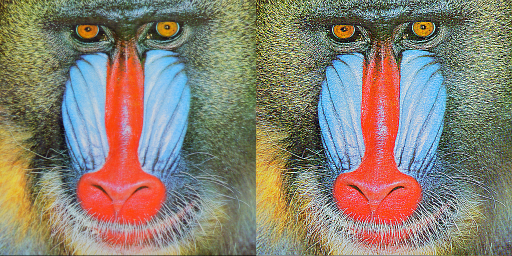

In [83]:
get_concat_h(baboon, baboon.filter(ImageFilter.EDGE_ENHANCE))

### Edge Emboss

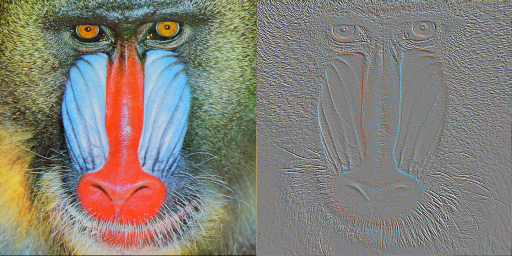

In [84]:
get_concat_h(baboon, baboon.filter(ImageFilter.EMBOSS))

### Añadiendo ruido a imagen

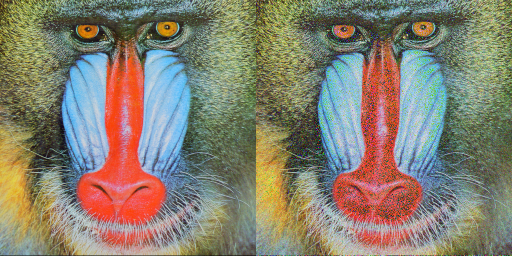

In [350]:
# Obtenemos las filas y columnas
rows, cols = baboon.size

# Crea valores usando la distribucion normal con la media 0 y desviacion estandar de 20,
# los valores son convertidos a unit8 lo que significa que se encuenran entre 0 y 255
noise = np.random.normal(0, 20, (rows, cols, 3)).astype(np.uint8)

# Añade ruido a la imagen
noisy_image = baboon + noise

# Crea una imagen PIL de un arreglo
noisy_image = Image.fromarray(noisy_image)

# Imprime la imagen original y la imagen con ruido
get_concat_h(baboon,noisy_image)

### Kernel personalizado

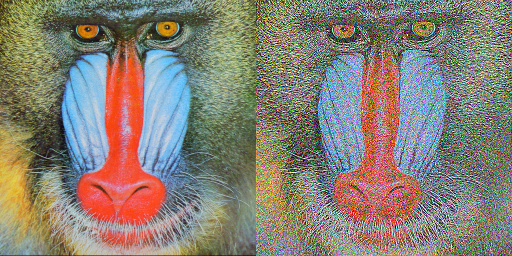

In [351]:
# Kernel comun para sharpening
kernel = np.array([[-1, -1, -1],
                   [-1, 9, -1],
                   [-1, -1, -1]])
kernel = ImageFilter.Kernel((3, 3), kernel.flatten())

# Aplica el filtro sharpening usando el kernelen la imagen original
sharpened = noisy_image.filter(kernel)

# Plots the sharpened image and the original image without noise
get_concat_h(baboon,sharpened)

## Image segmentation

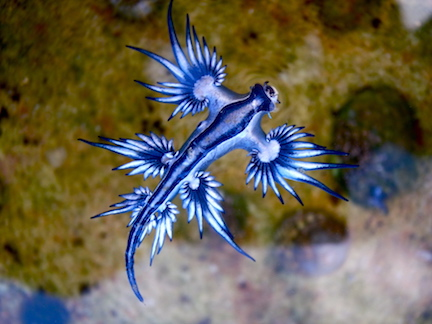

In [206]:
animal = Image.open(r"images\animals.jpg")
animal.load()
animal

### Filtro Thresold

Iterador donde varia el umbral para obtener el umbral optimo.

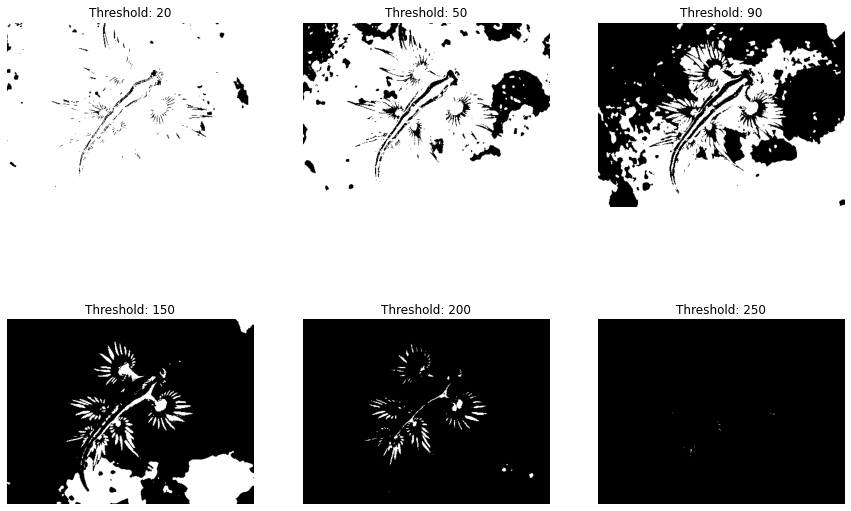

In [208]:
threshold_list = [20,50,90,150,200,250]
counter = 1
plt.figure(figsize=(15, 10))
for threshold in threshold_list:
    plt.subplot(2, 3, counter)
    plt.title("Threshold: {}".format(threshold))
    plt.imshow(animal.convert("L").point(
        lambda x: 255 if x > threshold else 0),
               cmap="gray")
    plt.axis("off")
    counter += 1
plt.show()

### Capas RGB

Capas de la imagen, la capa azul muestra una mayor intensidad sobre el animal.

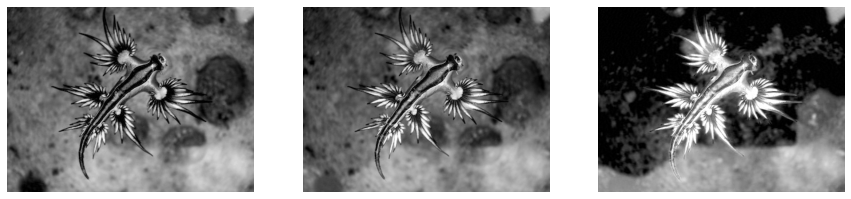

In [209]:
red, green, blue = animal.split()
counter = 1

plt.figure(figsize=(15, 10))
for layer in [red, green, blue]:
    plt.subplot(1, 3, counter)
    plt.imshow(layer, cmap="gray")
    plt.axis("off")
    counter += 1
plt.show()

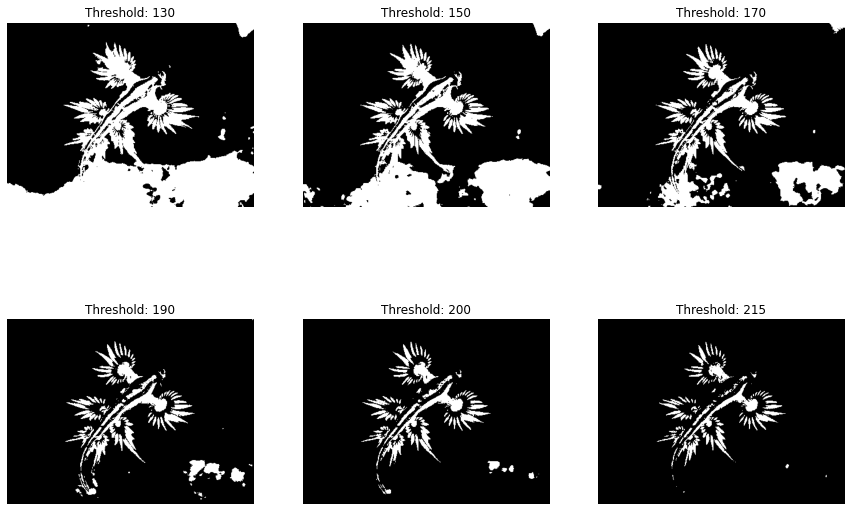

In [210]:
# Se itera el umbral sobre la capa azul de la imagen importada
threshold_list = [130, 150, 170, 190, 200, 215]
counter = 1

plt.figure(figsize=(15, 10))
for threshold in threshold_list:
    plt.subplot(2, 3, counter)
    plt.title("Threshold: {}".format(threshold))
    plt.imshow(blue.point(
        lambda x: 255 if x > threshold else 0), cmap="gray")
    plt.axis("off")
    counter += 1
plt.show()

## Erosion and expansion

Estos filtros pueden utilizarse durante la segmentación de imagen, pues permite quitar porciones de imagen que no necesitemos.

### MinFilter

Sustituye el valor minimo de dentro de la matriz de la dimension deseada.

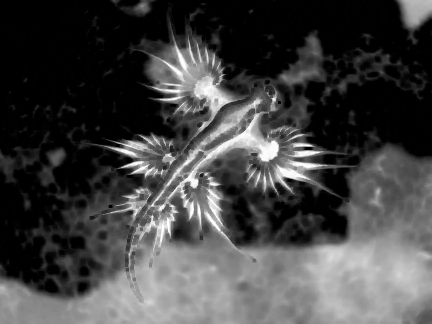

In [211]:
blue.filter(ImageFilter.MinFilter(3))

### MaxFilter

Sustituye el valor maximo de dentro de la matriz de la dimension deseada.

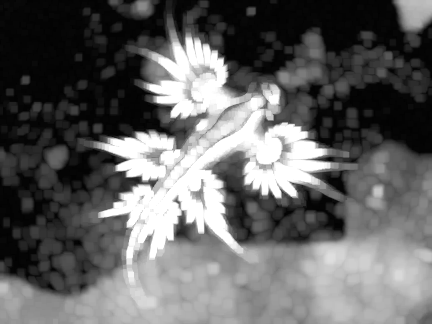

In [212]:
blue.filter(ImageFilter.MaxFilter(5))

In [213]:
# Funciones para aplicar de manera consecuente los filtros mencionados

def erode(cycles:int, image):
    """La funcion erosion disminuye la intensidad de manchas aisladas.

    Args:
        cycles (int): Ciclos de erosion que se aplicaran.
        image (PIL.Image): Imagen a la que se le aplicara la erosion.

    Returns:
        PIL.Image: Retorna una imagen con los ciclos aplicados.
    """
    for _ in range(cycles):
        image = image.filter(ImageFilter.MinFilter(3))
    return image

def dilate(cycles:int, image):
    """La funcion dilatacion expande la intensidad de manchas.

    Args:
        cycles (int): Ciclos de erosion que se aplicaran.
        image (PIL.Image): Imagen a la que se le aplicara la dilatacion.

    Returns:
        PIL.Image: Retorna una imagen con los ciclos aplicados.
    """
    for _ in range(cycles):
        image = image.filter(ImageFilter.MaxFilter(3))
    return image


## Segmentacion con Thresold, Erosion y Expansion

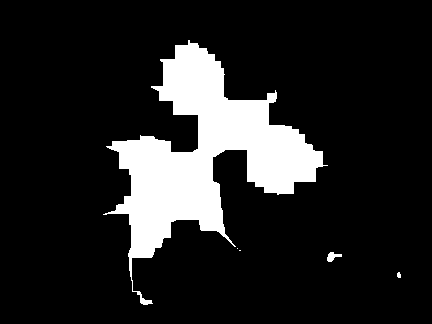

In [214]:
animal_steps = blue.point(lambda x: 255 if x > 210 else 0)
animal_steps = dilate(10,animal_steps)
animal_steps = erode(10,animal_steps)
animal_mask = animal_steps
animal_mask

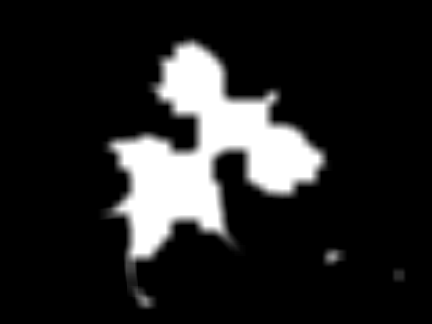

In [215]:
animal_mask = animal_mask.filter(ImageFilter.BoxBlur(5))
animal_mask

### Imagen segmentada

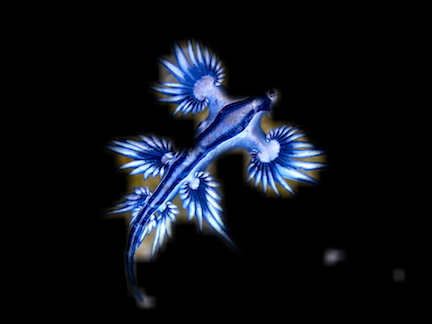

In [216]:
blank = animal.point(lambda _: 0)
animal_segment = Image.composite(animal, blank, animal_mask)
animal_segment

### Imagen de fondo

In [330]:
background = Image.open(r"images\background.jpg")
to_paste = animal_segment.reduce(4)
to_mask = animal_mask.reduce(4)

print(animal.size)
print(to_paste.size)
print(to_mask.size)

(432, 324)
(108, 81)
(108, 81)


### Fondo e imagen segmentada

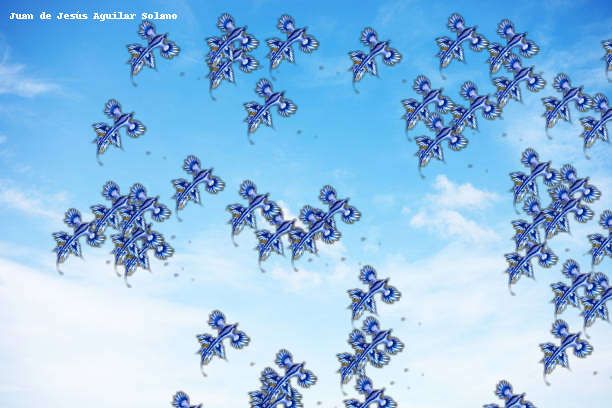

In [331]:
import numpy as np
from PIL import ImageDraw

n = 50
x_list = np.random.randint(background.width,size=n)
y_list = np.random.randint(background.height,size=n)

draw = ImageDraw.Draw(background)
draw.text((10,10),"Juan de Jesús Aguilar Solano")

for x,y in zip(x_list,y_list):
    background.paste(to_paste,(x,y),to_mask)
background

## Marca de agua

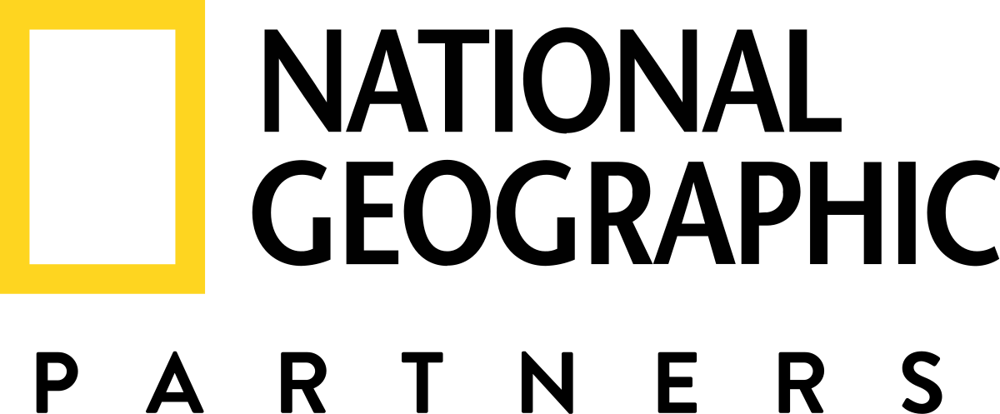

In [332]:
logo = Image.open(r"images\nat_logo.png")
logo

### Filtro Contour

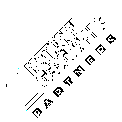

In [333]:
logo = logo.reduce(10)

logo = logo.filter(ImageFilter.CONTOUR)
logo = logo.point(lambda x: 0 if x == 255 else 255)
logo = logo.rotate(45, expand=True)
logo

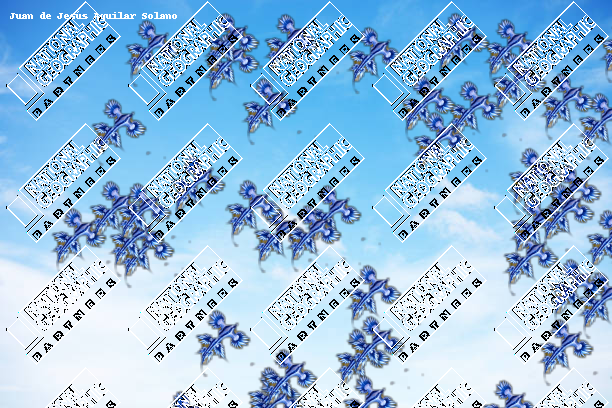

In [334]:
for x in range(0,background.width,logo.width):
    for y in range(0,background.height,logo.height):
        background.paste(logo,(x,y),logo)
background